# **Install and authenticate Kaggle API**

In [1]:

!pip install -q kaggle

# Upload your kaggle.json (API token file)
from google.colab import files
files.upload()   # Upload kaggle.json from your Kaggle account

# Make a directory for Kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


Saving kaggle.json to kaggle.json


# **Download the dataset from Kaggle**

In [2]:

!kaggle datasets download -d akhatova/pcb-defects

# Unzip dataset
!unzip -q pcb-defects.zip -d ./pcb_defects


Dataset URL: https://www.kaggle.com/datasets/akhatova/pcb-defects
License(s): unknown
100% 1.87G/1.88G [00:15<00:00, 179MB/s]
100% 1.88G/1.88G [00:15<00:00, 133MB/s]


#**Importing the standard libraries**

In [3]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
import os
import random
import re
import shutil
sns.set_style('darkgrid')
sns.set_palette('pastel')

import warnings
warnings.filterwarnings('ignore')


# **Understanding the dataset**

In [4]:
input_dir= "pcb_defects/PCB_DATASET"
os.listdir(input_dir)

['rotation', 'Annotations', 'rotate.py', 'PCB_USED', 'images']

*  **PCB USED folder**- contains the 12 template images we used in the dataset.
* **images folder**- contains the PCB images subclassed into different types.
* **rotation folder**- contains the rotated PCB images subclassed into different types as well as rotation angle
* **annotations folder**- contains the annotations for bounding box of each images





# **Analyzing the PCB USED folder**

In [5]:
template_dir=os.path.join(input_dir,'PCB_USED')
template_dir

'pcb_defects/PCB_DATASET/PCB_USED'

# **visualize images**

In [6]:
def visualize_img(dir_name,nos_):
    k=1
    plt.figure(figsize=(8,(nos_//2)*6))
    for filename in os.listdir(dir_name)[0:nos_]:
        if filename.lower().endswith(('.jpg','.jpeg','.png')):
            ax=plt.subplot((nos_//2)+1,2,k)
            img_path=os.path.join(dir_name,filename)
            img=plt.imread(img_path)
            ax.imshow(img)
            ax.set_xlabel(filename)
            ax.grid(False)
            ax.set_xticks([])
            ax.set_yticks([])
            k+=1
    plt.tight_layout()
    plt.show()

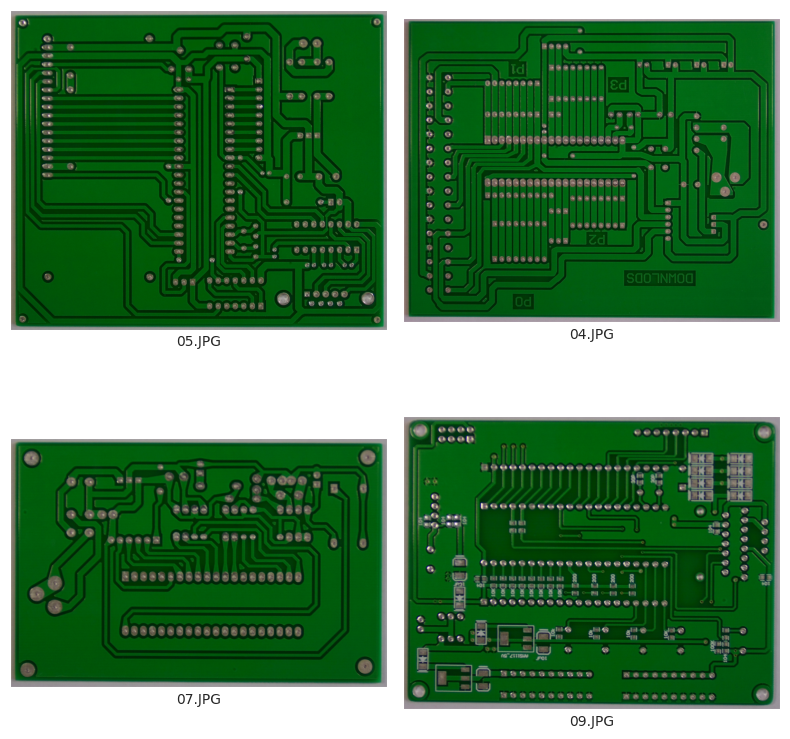

No of template images:10


In [7]:
visualize_img(template_dir,nos_=4)

print(f'No of template images:{len(os.listdir(template_dir))}')

# **Analyzing the images folder**

In [8]:

img_dir=os.path.join(input_dir,'images')

#Listing the types of defects
os.listdir(img_dir)
types_defect=os.listdir(os.path.join(input_dir,'images'))
types_defect

['Missing_hole',
 'Short',
 'Open_circuit',
 'Spurious_copper',
 'Spur',
 'Mouse_bite']

In [9]:

img_path_list=[]
#Creating img_path list
for sub_cat in types_defect:
    for file in os.listdir(os.path.join(img_dir,sub_cat)):

        img_path_list.append(os.path.join(img_dir,sub_cat,file))


# **Vizualizing defect images for each type**

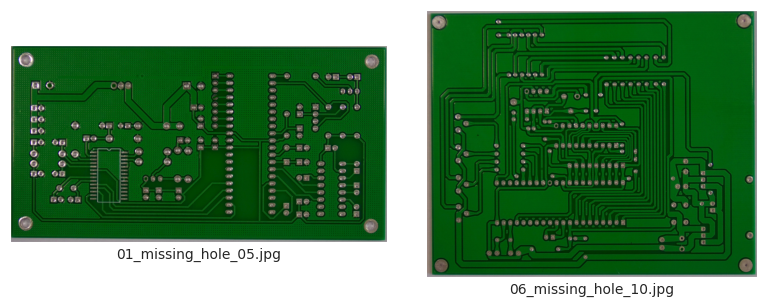

No of Missing_hole images:115


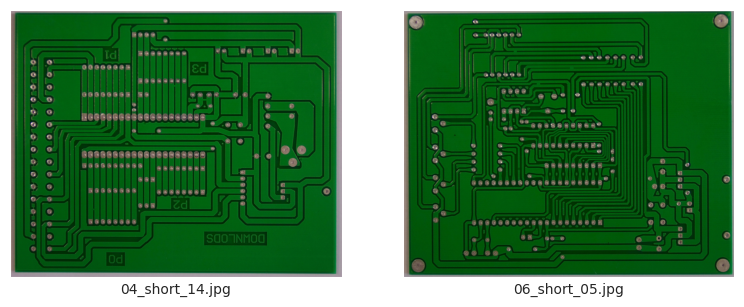

No of Short images:116


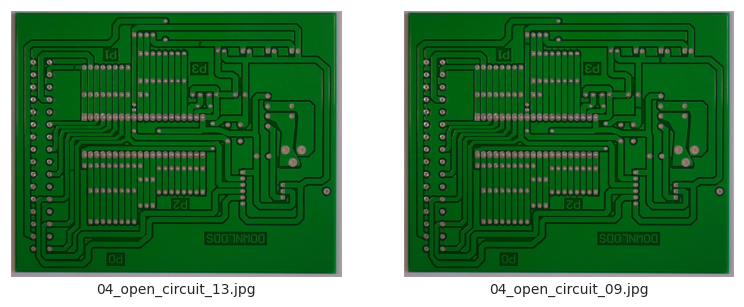

No of Open_circuit images:116


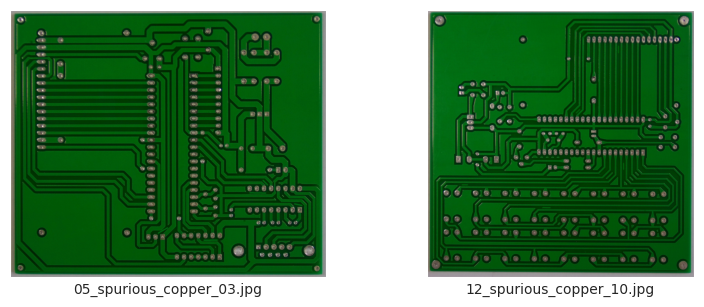

No of Spurious_copper images:116


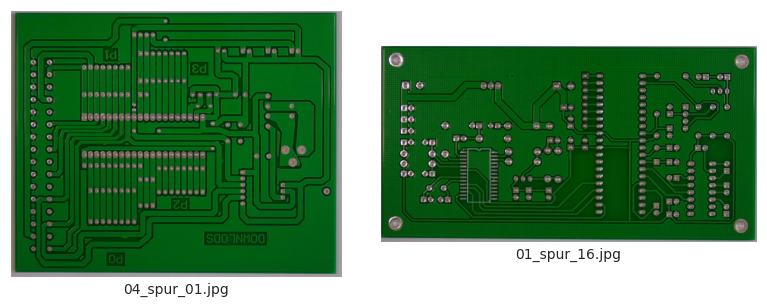

No of Spur images:115


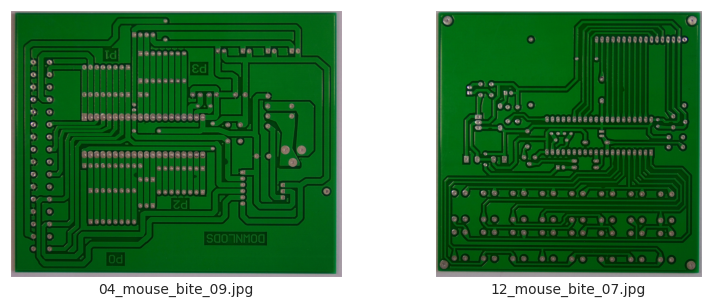

No of Mouse_bite images:115


In [10]:

df_defect=pd.DataFrame(columns=['No of defect'])
for sub_cat in types_defect:
    visualize_img(os.path.join(img_dir,sub_cat),nos_=2)

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(img_dir,sub_cat)))}')

    df_defect.loc[sub_cat]=len(os.listdir(os.path.join(img_dir,sub_cat)))


# **No. of defects by type**

In [11]:

df_defect

,No of defect
Missing_hole,115
Short,116
Open_circuit,116
Spurious_copper,116
Spur,115
Mouse_bite,115


# **Analyzing rotated folder**

In [12]:
rotated_dir=os.path.join(input_dir,'rotation')
os.listdir(rotated_dir)

['Spurious_copper_rotation',
 'Spurious_copper_angles.txt',
 'Spur_angles.txt',
 'Missing_hole_angles.txt',
 'Mouse_bite_angles.txt',
 'Mouse_bite_rotation',
 'Open_circuit_angles.txt',
 'Short_rotation',
 'Missing_hole_rotation',
 'Short_angles.txt',
 'Open_circuit_rotation',
 'Spur_rotation']

In [13]:
rotated_angle_list=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')]
rotated_angle_list

['Spurious_copper_angles.txt',
 'Spur_angles.txt',
 'Missing_hole_angles.txt',
 'Mouse_bite_angles.txt',
 'Open_circuit_angles.txt',
 'Short_angles.txt']

In [14]:
types_defect_rotated=[j for j in os.listdir(rotated_dir) if j.endswith('.txt')==False]
types_defect_rotated

['Spurious_copper_rotation',
 'Mouse_bite_rotation',
 'Short_rotation',
 'Missing_hole_rotation',
 'Open_circuit_rotation',
 'Spur_rotation']

# **Vizualizing rotated defects**

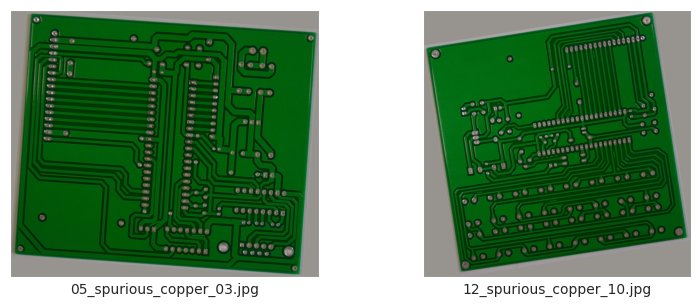

No of Spurious_copper_rotation images:116


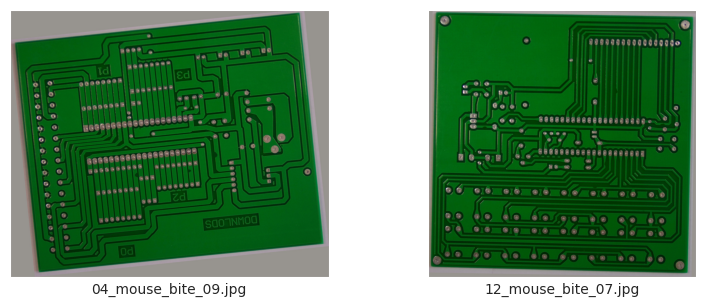

No of Mouse_bite_rotation images:115


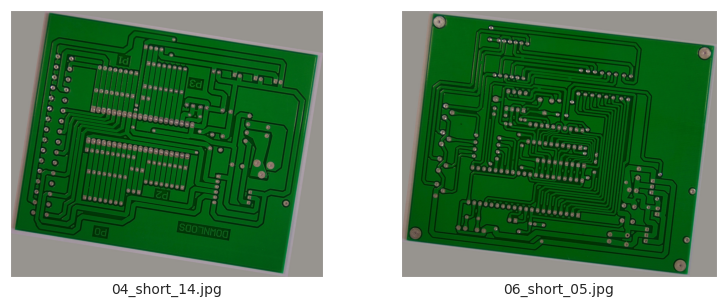

No of Short_rotation images:116


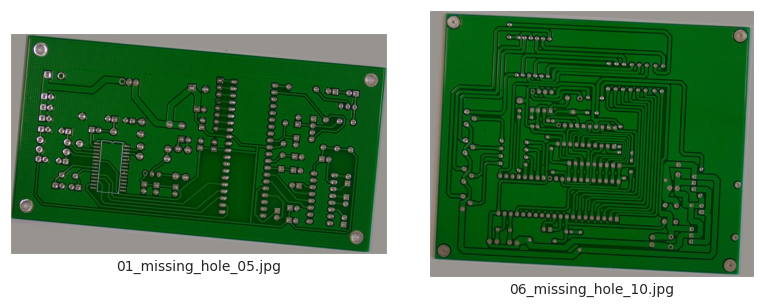

No of Missing_hole_rotation images:115


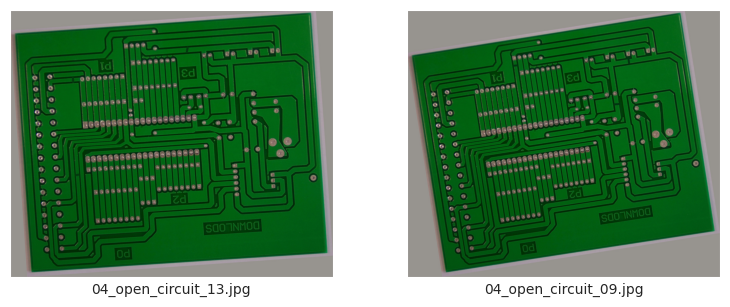

No of Open_circuit_rotation images:116


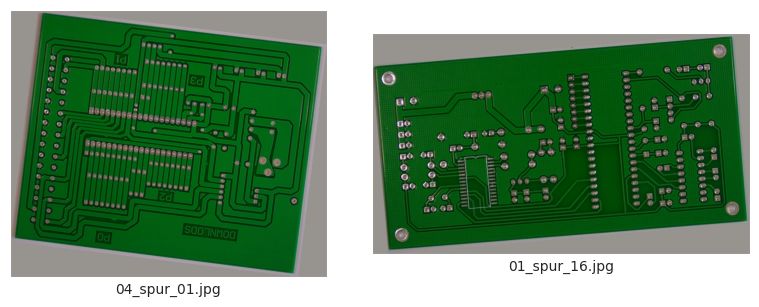

No of Spur_rotation images:115


In [15]:

df_defect_rotated=pd.DataFrame(columns=['No of defect'])
for sub_cat in types_defect_rotated:
    visualize_img(os.path.join(rotated_dir,sub_cat),nos_=2)

    print(f'No of {sub_cat} images:{len(os.listdir(os.path.join(rotated_dir,sub_cat)))}')

    df_defect_rotated.loc[sub_cat]=len(os.listdir(os.path.join(rotated_dir,sub_cat)))

# **No. of defects by type  rotated**

In [16]:
df_defect_rotated

,No of defect
Spurious_copper_rotation,116
Mouse_bite_rotation,115
Short_rotation,116
Missing_hole_rotation,115
Open_circuit_rotation,116
Spur_rotation,115


# **Reading the rotation text files**

In [17]:


df_rotation_angle=pd.DataFrame(columns=['Line','Angle'])
for filename in rotated_angle_list:
    with open(os.path.join(rotated_dir,filename),'r') as f:
        lines=f.readlines()
        for line in lines:
            text,angle=line.split()
            df_rotation_angle=pd.concat([df_rotation_angle,pd.DataFrame({'Line':[text],'Angle':[angle]})],axis=0)


In [18]:
df_rotation_angle

,Line,Angle
0,04_spurious_copper_01,1
0,04_spurious_copper_20,-10
0,09_spurious_copper_05,1
0,01_spurious_copper_07,10
0,04_spurious_copper_15,-10
...,...,...
0,07_short_02,6
0,09_short_01,3
0,07_short_03,0
0,11_short_03,1


# **Analyzing the annotate folder**

In [19]:
annote_dir=os.path.join(input_dir,'Annotations')
annote_dir

'pcb_defects/PCB_DATASET/Annotations'

In [20]:
type_annot=os.listdir(annote_dir)
type_annot

['Missing_hole',
 'Short',
 'Open_circuit',
 'Spurious_copper',
 'Spur',
 'Mouse_bite']

In [21]:
df_annot_nos=pd.DataFrame(columns=['No of annotations'])

for i in type_annot:
    df_annot_nos.loc[i]=len(os.listdir(os.path.join(annote_dir,i)))
df_annot_nos

,No of annotations
Missing_hole,115
Short,116
Open_circuit,116
Spurious_copper,116
Spur,115
Mouse_bite,115


# **annotation file for each image**

In [22]:
file_list=os.listdir(os.path.join(annote_dir,'Mouse_bite'))
file_list[0:5]

['10_mouse_bite_03.xml',
 '06_mouse_bite_01.xml',
 '07_mouse_bite_04.xml',
 '11_mouse_bite_10.xml',
 '01_mouse_bite_12.xml']

# **XML format, so we have to parse the data**

In [23]:
import xml.etree.ElementTree as ET



In [24]:
tree = ET.parse(os.path.join(os.path.join(annote_dir,'Mouse_bite'),'01_mouse_bite_11.xml'))
root = tree.getroot()

# **getting the structure of XML file**

In [25]:

print(ET.tostring(root, encoding='utf8').decode('utf8'))

<?xml version='1.0' encoding='utf8'?>
<annotation>
	<folder>Mouse_bite</folder>
	<filename>01_mouse_bite_11.jpg</filename>
	<path>/home/weapon/Desktop/PCB_DATASET/Mouse_bite/01_mouse_bite_11.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>3034</width>
		<height>1586</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1199</xmin>
			<ymin>966</ymin>
			<xmax>1234</xmax>
			<ymax>1004</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>2042</xmin>
			<ymin>755</ymin>
			<xmax>2073</xmax>
			<ymax>786</ymax>
		</bndbox>
	</object>
	<object>
		<name>mouse_bite</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>1472</xmin>
			<ymin>607</ymin>
		

# **Parsing XML to return Bounding box dimensions**

In [26]:

def parse_xml(xml_file):

    data=[]

    tree = ET.parse(xml_file)
    root = tree.getroot()

    filename = root.find('filename').text
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)
    for obj in root.findall('object'):
        name = obj.find('name').text
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)

        data.append({
            'filename': filename,
            'width': width,
            'height': height,
            'class': name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })

    return data

# **Retrieving data for all files**

In [27]:

data=[]
all_data=[]

for x in type_annot:
    for file in os.listdir(os.path.join(annote_dir,x)):
        xml_file_path=os.path.join(os.path.join(annote_dir,x),file)
        data=parse_xml(xml_file_path)
        all_data.extend(data)


# **dataframe to store the annotations**

In [28]:

df_annot=pd.DataFrame(all_data)
df_annot

,filename,width,height,class,xmin,ymin,xmax,ymax
0,04_missing_hole_08.jpg,3056,2464,missing_hole,1967,1177,2047,1253
1,04_missing_hole_08.jpg,3056,2464,missing_hole,1344,1430,1402,1502
2,04_missing_hole_08.jpg,3056,2464,missing_hole,1742,1428,1806,1504
3,08_missing_hole_07.jpg,2759,2154,missing_hole,1876,1036,1941,1098
4,08_missing_hole_07.jpg,2759,2154,missing_hole,2128,941,2200,1020
...,...,...,...,...,...,...,...,...
2948,05_mouse_bite_04.jpg,2544,2156,mouse_bite,1028,688,1086,735
2949,05_mouse_bite_04.jpg,2544,2156,mouse_bite,1563,859,1624,918
2950,05_mouse_bite_04.jpg,2544,2156,mouse_bite,2075,1651,2125,1696
2951,05_mouse_bite_04.jpg,2544,2156,mouse_bite,1502,1701,1552,1746


In [29]:
import os
import shutil

img_dir = "/content/pcb_defects/PCB_DATASET/images"

# Define the source directories for each category inside img_dir
source_dirs = [
    os.path.join(img_dir, "Missing_hole"),
    os.path.join(img_dir, "Mouse_bite"),
    os.path.join(img_dir, "Open_circuit"),
    os.path.join(img_dir, "Short"),
    os.path.join(img_dir, "Spur"),
    os.path.join(img_dir, "Spurious_copper")
]


destination_dir = "/content/images_combined"

os.makedirs(destination_dir, exist_ok=True)

for source_dir in source_dirs:
    if os.path.exists(source_dir):
        files = os.listdir(source_dir)

        for file in files:
            file_path = os.path.join(source_dir, file)
            if os.path.isfile(file_path):
                shutil.copy(file_path, destination_dir)
    else:
        print(f"Directory {source_dir} does not exist.")


files_in_combined = os.listdir(destination_dir)
print(f"Number of files copied: {len(files_in_combined)}")


Number of files copied: 693


In [30]:
destination_dir

'/content/images_combined'

# **no of defects in each pcb**

Text(0.5, 0, 'No of defects in one PCB')

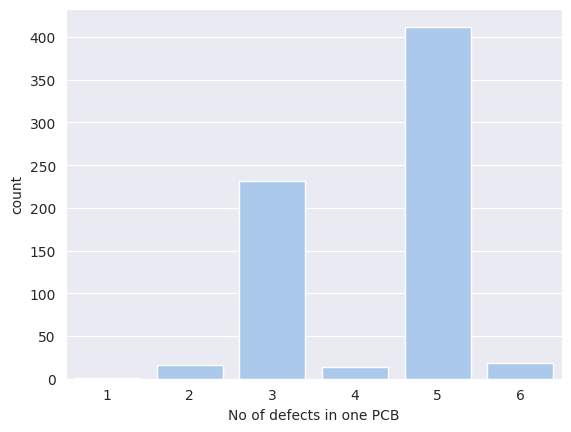

In [31]:

df_multiple_defects=pd.DataFrame(df_annot['filename'].value_counts())
sns.countplot(df_multiple_defects,x='count')
plt.xlabel('No of defects in one PCB')

# **bounding box**

In [32]:
#Defining a function to view image along with bounding box

def draw_bounding_boxes(image_path, bounding_boxes,annotation):
    """
    Draws multiple bounding boxes on an image using Matplotlib.

    Args:
        image_path: The path to the image file.
        bounding_boxes: A list of bounding boxes, each represented as a tuple or list containing
                       (min_x, min_y, max_x, max_y).
    """

    img = plt.imread(image_path)

    fig, ax = plt.subplots(figsize=(15,10))

    ax.imshow(img)

    for bbox in bounding_boxes:
        min_x, min_y, max_x, max_y = bbox
        width = max_x - min_x
        height = max_y - min_y
        rect = patches.Rectangle((min_x, min_y), width, height, linewidth=1, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Calculate the centroid of the bounding box
        centroid_x = (min_x + max_x) / 2
        centroid_y = (min_y + max_y) / 2

        ax.annotate( annotation,(centroid_x,centroid_y),(max_x+20,max_y+20),
            fontsize=10,color='white',
            horizontalalignment='right', verticalalignment='top')

    plt.grid(False)
    plt.xticks([])
    plt.yticks([])

    plt.show()


In [33]:
filepath=img_path_list[0]
filename=re.sub(r'.+/([\w_]+\.jpg)',r'\1',filepath)
filename

'01_missing_hole_05.jpg'

In [34]:
def visualize_annotations(list_image_path, df):
    for i in list_image_path:
        filepath = i
        filename = re.sub(r'.+/([\w_]+\.jpg)', r'\1', filepath)
        df_selected = df[df['filename'] == filename]
        width  = df_selected['width'].values
        height = df_selected['height'].values

        # check if 'class' or 'class_name' exists
        if 'class_name' in df_selected.columns:
            class_name = df_selected['class_name'].values
        elif 'class' in df_selected.columns:
            class_name = df_selected['class'].values
        else:
            raise KeyError("No class column found in dataframe")

        xmin = df_selected['xmin'].values
        ymin = df_selected['ymin'].values
        xmax = df_selected['xmax'].values
        ymax = df_selected['ymax'].values

        bbox = zip(xmin, ymin, xmax, ymax)
        draw_bounding_boxes(filepath, bbox, class_name[0])


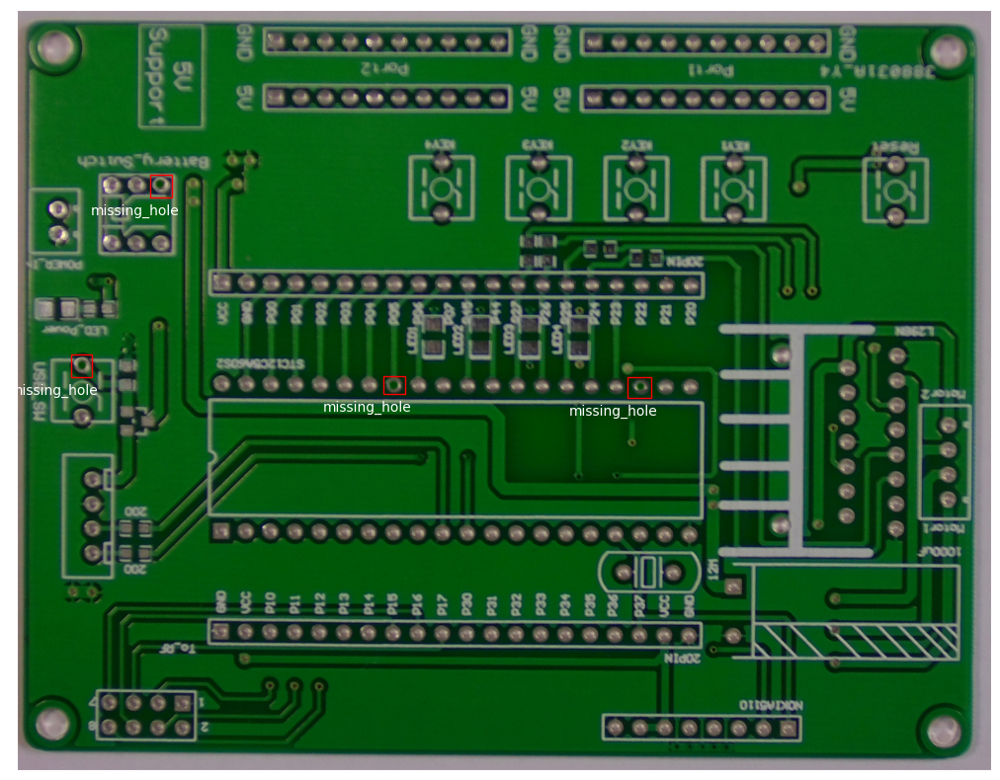

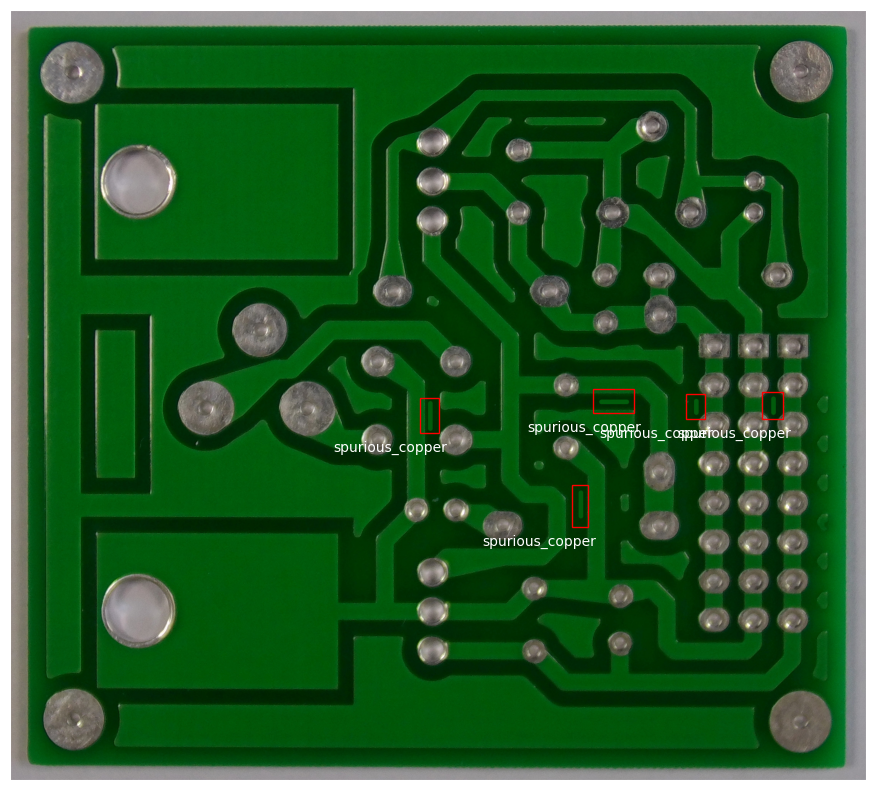

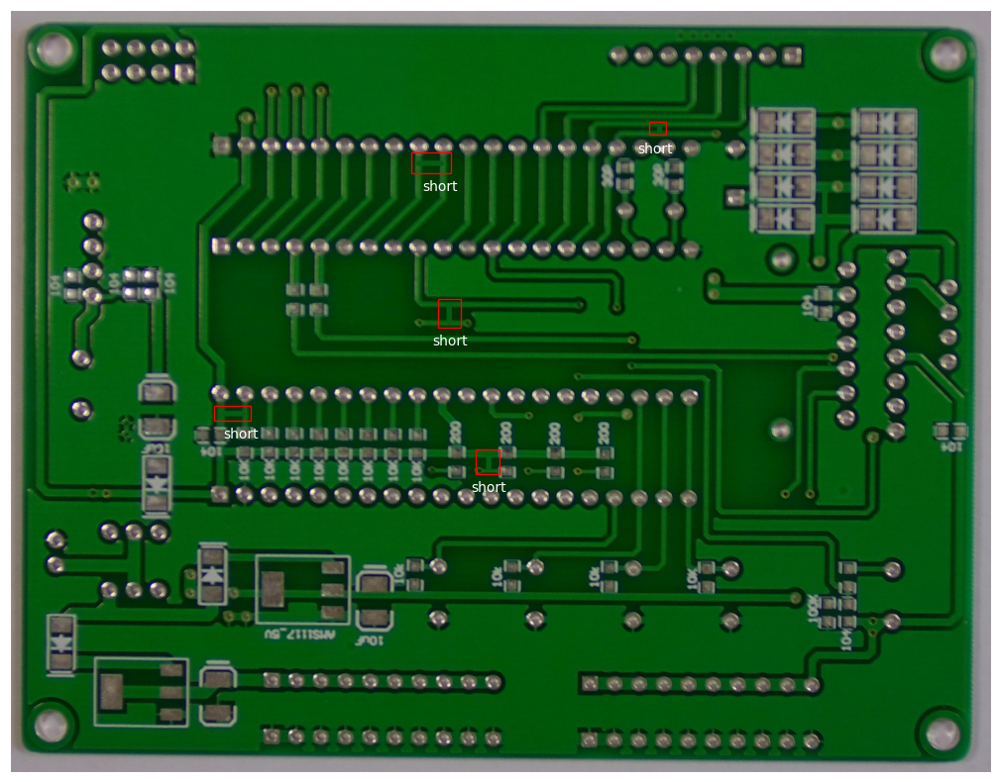

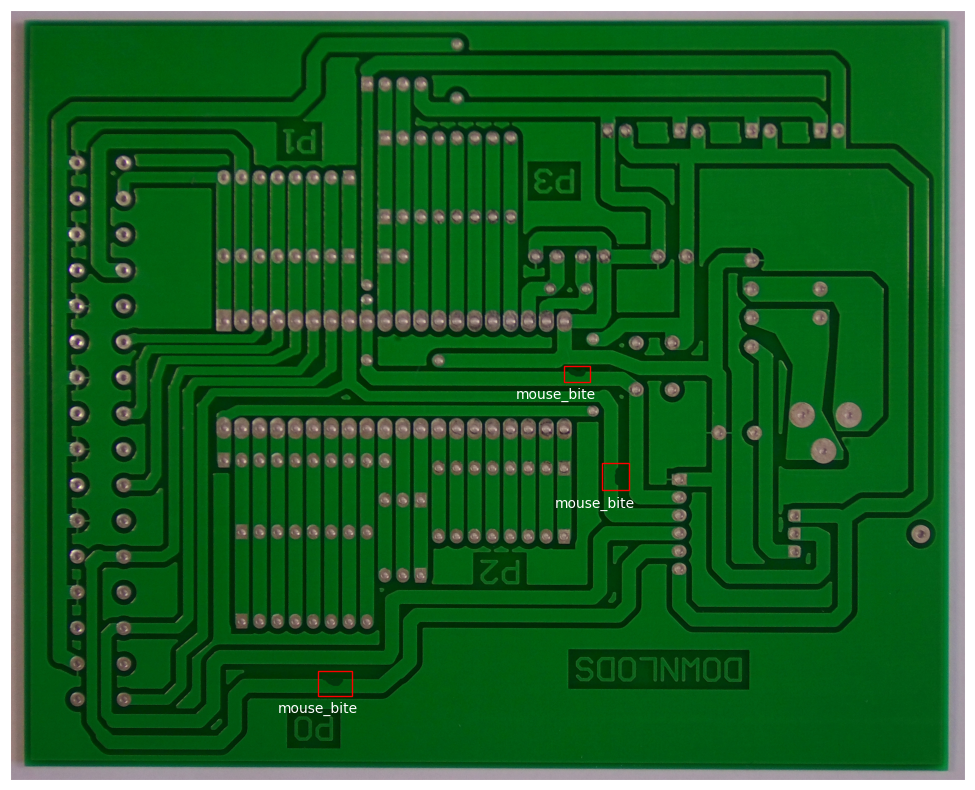

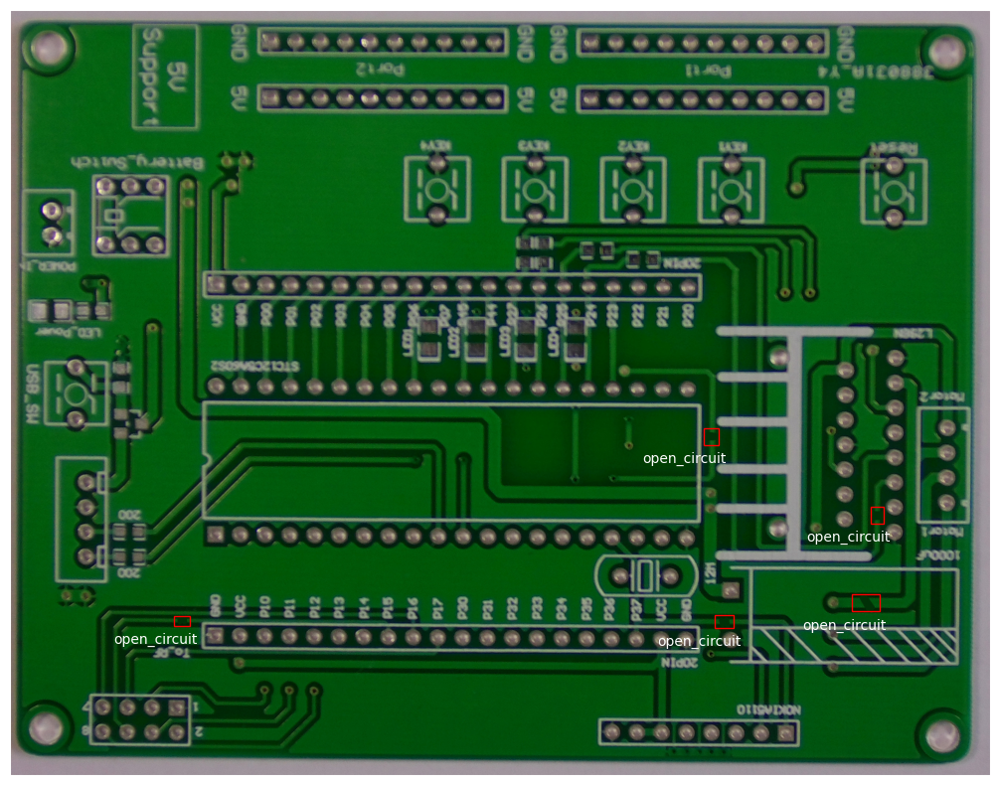

In [35]:
image_path_shuffle=img_path_list
random.shuffle(image_path_shuffle)

visualize_annotations(image_path_shuffle[0:5],df_annot)

In [36]:

# IMPORTING LIBRARIES AND CONFIGURATION
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import models, transforms, utils

from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import time
import copy
import os

print("PyTorch Version:", torch.__version__)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


PyTorch Version: 2.8.0+cu126
Using device: cuda


Preview of the provided annotation DataFrame:
                 filename  width  height    class_name  xmin  ymin  xmax  ymax
0  04_missing_hole_08.jpg   3056    2464  missing_hole  1967  1177  2047  1253
1  04_missing_hole_08.jpg   3056    2464  missing_hole  1344  1430  1402  1502
2  04_missing_hole_08.jpg   3056    2464  missing_hole  1742  1428  1806  1504
3  08_missing_hole_07.jpg   2759    2154  missing_hole  1876  1036  1941  1098
4  08_missing_hole_07.jpg   2759    2154  missing_hole  2128   941  2200  1020

6 classes detected in the DataFrame: ['missing_hole', 'mouse_bite', 'open_circuit', 'short', 'spur', 'spurious_copper']
Number of defects - Training: 2056, Validation: 446, Test: 451

Visualizing a batch of cropped defect patches...


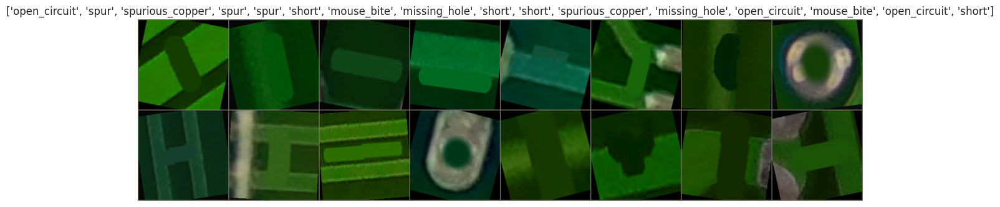

In [37]:
# DATA PREPARATION (using df_annot and img_dir)

img_dir = destination_dir


if 'class' in df_annot.columns:
    df_annot = df_annot.rename(columns={'class': 'class_name'})

print("Preview of the provided annotation DataFrame:")
print(df_annot.head())


class_names = sorted(df_annot['class_name'].unique())
num_classes = len(class_names)
print(f"\n{num_classes} classes detected in the DataFrame: {class_names}")


unique_filenames = df_annot['filename'].unique()
train_files, test_val_files = train_test_split(unique_filenames, test_size=0.3, random_state=42)
val_files, test_files = train_test_split(test_val_files, test_size=0.5, random_state=42) # 0.3 * 0.5 = 0.15

train_df = df_annot[df_annot['filename'].isin(train_files)].reset_index(drop=True)
val_df = df_annot[df_annot['filename'].isin(val_files)].reset_index(drop=True)
test_df = df_annot[df_annot['filename'].isin(test_files)].reset_index(drop=True)

dataset_sizes = {'train': len(train_df), 'val': len(val_df), 'test': len(test_df)}
print(f"Number of defects - Training: {dataset_sizes['train']}, Validation: {dataset_sizes['val']}, Test: {dataset_sizes['test']}")

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

class PCBCropDataset(Dataset):
    def __init__(self, dataframe, image_dir, class_names, transform=None):
        self.df = dataframe
        self.image_dir = image_dir
        self.transform = transform
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(class_names)}

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_filename = row['filename']
        box = (row['xmin'], row['ymin'], row['xmax'], row['ymax'])
        label_idx = self.class_to_idx[row['class_name']]

        try:
            img_path = os.path.join(self.image_dir, img_filename)
            image = Image.open(img_path).convert('RGB')
            cropped_image = image.crop(box)
        except FileNotFoundError:
            print(f"Warning: File not found {img_path}. Returning an empty tensor.")
            return torch.zeros((3, 224, 224)), -1

        if self.transform:
            cropped_image = self.transform(cropped_image)

        return cropped_image, label_idx

train_dataset = PCBCropDataset(train_df, img_dir, class_names, transform=data_transforms['train'])
val_dataset = PCBCropDataset(val_df, img_dir, class_names, transform=data_transforms['val'])
test_dataset = PCBCropDataset(test_df, img_dir, class_names, transform=data_transforms['val'])


batch_size = 16

dataloaders = {
    'train': DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=os.cpu_count()),
    'val': DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=os.cpu_count()),
    'test': DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=os.cpu_count())
}


print("\nVisualizing a batch of cropped defect patches...")
inputs, classes_idx = next(iter(dataloaders['train']))
out = utils.make_grid(inputs)

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406]); std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean; inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 8)); plt.imshow(inp)
    if title is not None: plt.title(title)
    plt.axis('off'); plt.show()

imshow(out, title=[class_names[x] for x in classes_idx])

In [38]:
#  PRETRAINED MODEL (ResNet18 - most performant approach)

def get_pretrained_model(num_classes):
    model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
    for param in model.parameters():
        param.requires_grad = False


    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_classes)

    return model.to(device)

In [39]:
#  TRAINING AND VALIDATION FUNCTION

def train_model(model, criterion, optimizer, num_epochs=25, patience=5):
    since = time.time()
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}' + ' | ' + '-'*10)
        for phase in ['train', 'val']:
            model.train() if phase == 'train' else model.eval()
            running_loss, running_corrects = 0.0, 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    if phase == 'train':
                        loss.backward(); optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            print(f'{phase.capitalize()} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_acc'].append(epoch_acc.item())

            if phase == 'val':
                if epoch_loss < best_loss:
                    print(f"Validation loss improved ({best_loss:.4f} -> {epoch_loss:.4f}). Saving model...")
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(model.state_dict())
                    epochs_no_improve = 0
                else:
                    epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f"\nEarly stopping triggered after {patience} epochs with no improvement.")
            break
        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed//60:.0f}m {time_elapsed%60:.0f}s')
    print(f'Best Validation Loss: {best_loss:4f}')

    model.load_state_dict(best_model_wts)
    return model, history


In [40]:
#  TRAINING EXECUTION

if torch.cuda.is_available():
    pass

resnet_model = get_pretrained_model(num_classes)


criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet_model.parameters()), lr=0.001)


best_resnet_model, history = train_model(resnet_model, criterion, optimizer, num_epochs=5, patience=5)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 138MB/s]


Epoch 1/5 | ----------
Train Loss: 1.3015 Acc: 0.5190
Val Loss: 0.9000 Acc: 0.7287
Validation loss improved (inf -> 0.9000). Saving model...

Epoch 2/5 | ----------
Train Loss: 0.8373 Acc: 0.7451
Val Loss: 0.6375 Acc: 0.8229
Validation loss improved (0.9000 -> 0.6375). Saving model...

Epoch 3/5 | ----------
Train Loss: 0.6810 Acc: 0.7923
Val Loss: 0.5144 Acc: 0.8610
Validation loss improved (0.6375 -> 0.5144). Saving model...

Epoch 4/5 | ----------
Train Loss: 0.5991 Acc: 0.8205
Val Loss: 0.5708 Acc: 0.7780

Epoch 5/5 | ----------
Train Loss: 0.5450 Acc: 0.8288
Val Loss: 0.4251 Acc: 0.8677
Validation loss improved (0.5144 -> 0.4251). Saving model...

Training complete in 10m 45s
Best Validation Loss: 0.425099


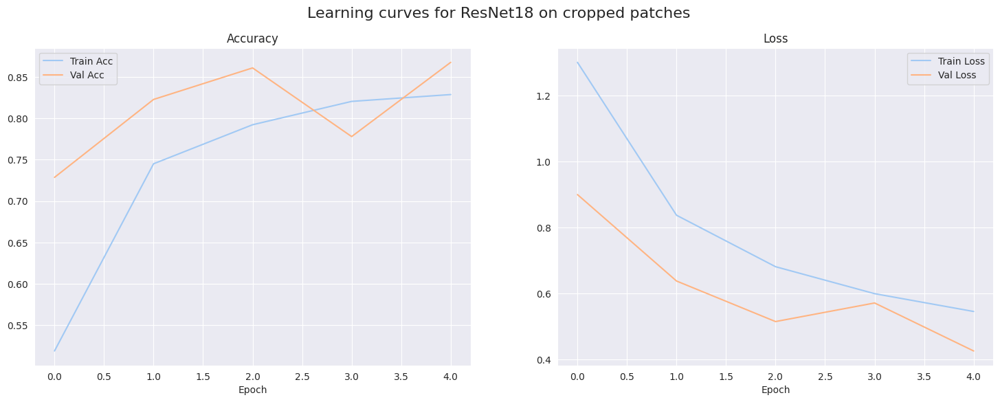

In [41]:
#  ANALYSIS AND EVALUATION OF RESULTS

def plot_history(history, model_name):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
    fig.suptitle(f"Learning curves for {model_name}", fontsize=16)
    ax1.plot(history['train_acc'], label='Train Acc'); ax1.plot(history['val_acc'], label='Val Acc')
    ax1.set_title('Accuracy'); ax1.set_xlabel('Epoch'); ax1.legend(); ax1.grid(True)
    ax2.plot(history['train_loss'], label='Train Loss'); ax2.plot(history['val_loss'], label='Val Loss')
    ax2.set_title('Loss'); ax2.set_xlabel('Epoch'); ax2.legend(); ax2.grid(True)
    plt.show()

plot_history(history, "ResNet18 on cropped patches")



# **Evaluation on the test set**


--- Final evaluation of model 'ResNet18' on the Test Set ---

                 precision    recall  f1-score   support

   missing_hole     0.9778    1.0000    0.9888        88
     mouse_bite     0.8788    0.7733    0.8227        75
   open_circuit     0.9324    0.9324    0.9324        74
          short     0.9583    0.7188    0.8214        64
           spur     0.7051    0.6962    0.7006        79
spurious_copper     0.7474    1.0000    0.8554        71

       accuracy                         0.8581       451
      macro avg     0.8666    0.8535    0.8536       451
   weighted avg     0.8671    0.8581    0.8567       451



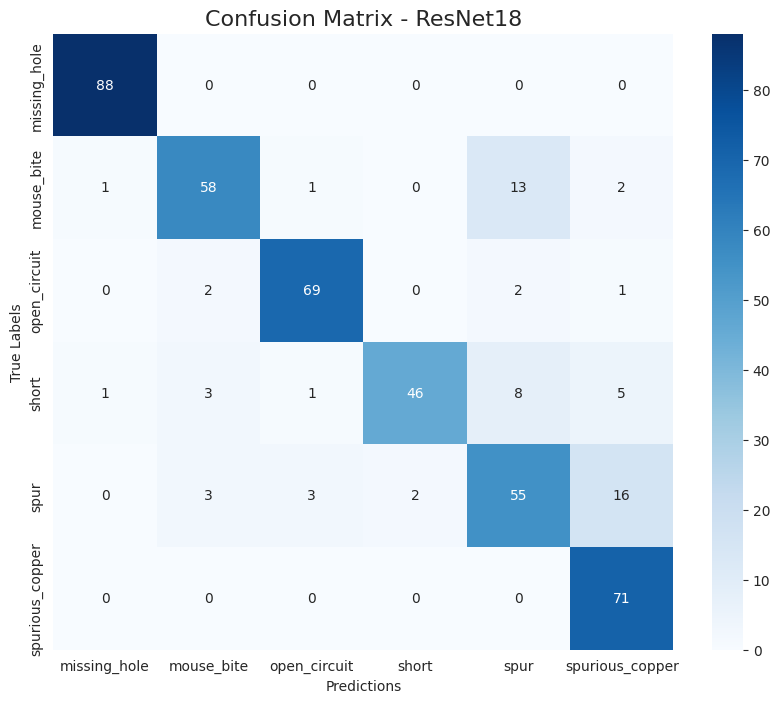

In [42]:
def evaluate_model(model, dataloader, model_name):
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for inputs, labels in dataloader:
            outputs = model(inputs.to(device))
            _, predicted = torch.max(outputs, 1)
            y_true.extend(labels.numpy())
            y_pred.extend(predicted.cpu().numpy())

    print(f"\n--- Final evaluation of model '{model_name}' on the Test Set ---\n")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix - {model_name}', fontsize=16)
    plt.xlabel('Predictions'); plt.ylabel('True Labels')
    plt.show()

evaluate_model(best_resnet_model, dataloaders['test'], "ResNet18")


# **Test the model on a single image**

In [43]:
RESNET_MODEL_PATH = "/content/resnet18_trained.pth"

torch.save(best_resnet_model.state_dict(), RESNET_MODEL_PATH)

print(f" Trained ResNet18 weights saved at: {RESNET_MODEL_PATH}")


 Trained ResNet18 weights saved at: /content/resnet18_trained.pth


# **SAVE THE TRAINED RESNET18 MODEL**

In [44]:

def test_single_prediction(model, test_loader, class_names):
    model.eval()

    # Get one batch from test loader
    inputs, labels = next(iter(test_loader))
    inputs = inputs.to(device)
    labels = labels.to(device)

    with torch.no_grad():
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

    # Get first image from batch
    sample_input = inputs[0]
    actual_label = labels[0].item()
    predicted_label = preds[0].item()
    confidence = torch.softmax(outputs[0], dim=0)[predicted_label].item()

    return sample_input, actual_label, predicted_label, confidence

sample_input, actual, predicted, confidence = test_single_prediction(best_resnet_model, dataloaders['test'], class_names)
print(f"Actual: {class_names[actual]}")
print(f"Predicted: {class_names[predicted]}")
print(f"Confidence: {confidence:.4f}")


Actual: missing_hole
Predicted: missing_hole
Confidence: 0.9970


 # **YOLO-style**

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 198MB/s]


Starting YOLO-style training...
Epoch 1/5 | ----------
Train Loss: 1.4473 Acc: 0.3838
Val Loss: 0.9050 Acc: 0.6457
Validation loss improved (inf -> 0.9050). Saving model...

Epoch 2/5 | ----------
Train Loss: 1.0139 Acc: 0.5963
Val Loss: 0.8154 Acc: 0.6592
Validation loss improved (0.9050 -> 0.8154). Saving model...

Epoch 3/5 | ----------
Train Loss: 0.9034 Acc: 0.6479
Val Loss: 0.4801 Acc: 0.8565
Validation loss improved (0.8154 -> 0.4801). Saving model...

Epoch 4/5 | ----------
Train Loss: 0.7913 Acc: 0.7087
Val Loss: 0.5276 Acc: 0.8004

Epoch 5/5 | ----------
Train Loss: 0.7428 Acc: 0.7189
Val Loss: 0.3630 Acc: 0.8722
Validation loss improved (0.4801 -> 0.3630). Saving model...

Training complete in 10m 46s
Best Validation Loss: 0.363019

--- YOLO-style Model Evaluation ---

--- Final evaluation of model 'YOLO-style Model' on the Test Set ---

                 precision    recall  f1-score   support

   missing_hole     1.0000    0.9886    0.9943        88
     mouse_bite     0.66

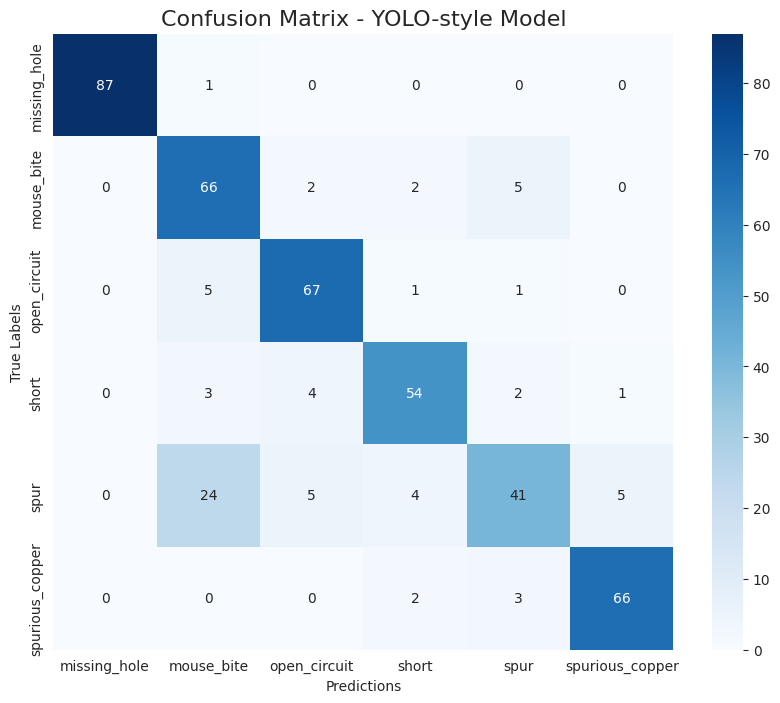

 YOLO-style model saved at: /content/yolo_model.pth


In [45]:
import torch
from torchvision import models
import torch.nn as nn
import torch.optim as optim

if torch.cuda.is_available():
    torch.cuda.empty_cache()

yolo_model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
for param in yolo_model.parameters():
    param.requires_grad = False

num_ftrs = yolo_model.fc.in_features
yolo_model.fc = nn.Sequential(
    nn.Linear(num_ftrs, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)
yolo_model = yolo_model.to(device)

optimizer_yolo = optim.Adam(filter(lambda p: p.requires_grad, yolo_model.parameters()), lr=0.001)

print("Starting YOLO-style training...")
best_yolo_model, history_yolo = train_model(yolo_model, criterion, optimizer_yolo, num_epochs=5, patience=5)

print("\n--- YOLO-style Model Evaluation ---")
evaluate_model(best_yolo_model, dataloaders['test'], "YOLO-style Model")

torch.save(best_yolo_model.state_dict(), "/content/yolo_model.pth")
print(" YOLO-style model saved at: /content/yolo_model.pth")


 # **Mobilenetv2**

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 129MB/s]

Starting MobileNetV2 training...
Epoch 1/5 | ----------


Train Loss: 1.1634 Acc: 0.5530
Val Loss: 0.7166 Acc: 0.7646
Validation loss improved (inf -> 0.7166). Saving model...

Epoch 2/5 | ----------
Train Loss: 0.7688 Acc: 0.7417
Val Loss: 0.5457 Acc: 0.8430
Validation loss improved (0.7166 -> 0.5457). Saving model...

Epoch 3/5 | ----------
Train Loss: 0.6479 Acc: 0.7758
Val Loss: 0.5595 Acc: 0.8117

Epoch 4/5 | ----------
Train Loss: 0.5677 Acc: 0.8089
Val Loss: 0.4672 Acc: 0.8475
Validation loss improved (0.5457 -> 0.4672). Saving model...

Epoch 5/5 | ----------
Train Loss: 0.5212 Acc: 0.8127
Val Loss: 0.5872 Acc: 0.7556

Training complete in 10m 45s
Best Validation Loss: 0.467213

--- MobileNetV2 Model Evaluation ---

--- Final evaluation of model 'MobileNetV2' on the Test Set ---

                 precision    recall  f1-score   support

   missing_hole     1.0000    1.0000    1.0000        88
     mouse_bite     0.7727    0.6800    0.7234        75
   open_circuit     0.8571    0.7297    0.7883        74
          short     0.9000    

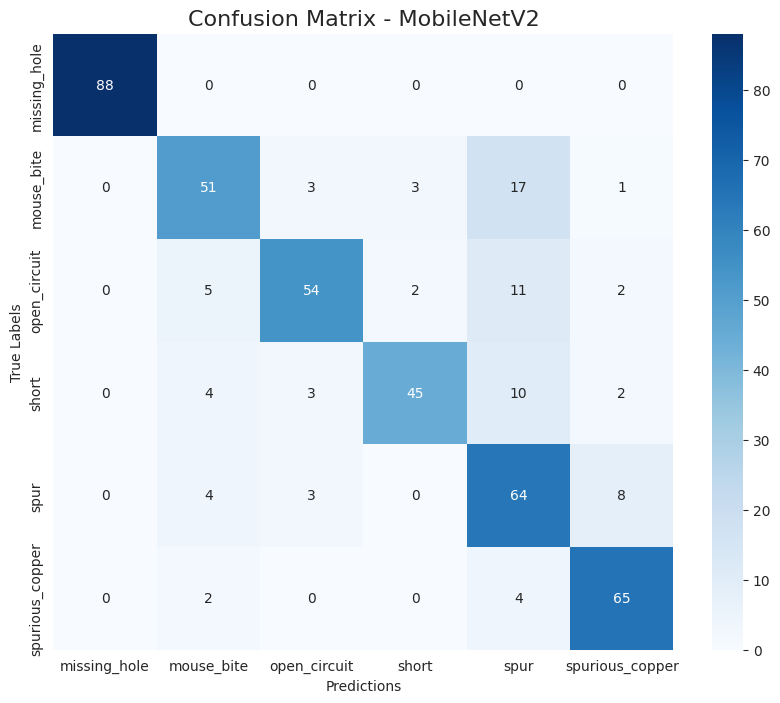

 MobileNetV2 model saved at: /content/mobilenet_model.pth


In [46]:
from torchvision import models
import torch.nn as nn
import torch.optim as optim

if torch.cuda.is_available():
    torch.cuda.empty_cache()

mobilenet_model = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)
for param in mobilenet_model.features.parameters():
    param.requires_grad = False

num_ftrs = mobilenet_model.classifier[1].in_features
mobilenet_model.classifier = nn.Sequential(
    nn.Dropout(0.2),
    nn.Linear(num_ftrs, num_classes)
)
mobilenet_model = mobilenet_model.to(device)

optimizer_mobilenet = optim.Adam(filter(lambda p: p.requires_grad, mobilenet_model.parameters()), lr=0.001)

print("Starting MobileNetV2 training...")
best_mobilenet_model, history_mobilenet = train_model(mobilenet_model, criterion, optimizer_mobilenet, num_epochs=5, patience=5)

print("\n--- MobileNetV2 Model Evaluation ---")
evaluate_model(best_mobilenet_model, dataloaders['test'], "MobileNetV2")

torch.save(best_mobilenet_model.state_dict(), "/content/mobilenet_model.pth")
print(" MobileNetV2 model saved at: /content/mobilenet_model.pth")


 # **CNN MODEL**

Training SimpleCNN from scratch...
Epoch 1/5 | ----------
Train Loss: 1.7862 Acc: 0.1984
Val Loss: 1.7458 Acc: 0.2018
Validation loss improved (inf -> 1.7458). Saving model...

Epoch 2/5 | ----------
Train Loss: 1.5343 Acc: 0.2977
Val Loss: 1.2737 Acc: 0.3991
Validation loss improved (1.7458 -> 1.2737). Saving model...

Epoch 3/5 | ----------
Train Loss: 1.4618 Acc: 0.3273
Val Loss: 1.3253 Acc: 0.4148

Epoch 4/5 | ----------
Train Loss: 1.3547 Acc: 0.3954
Val Loss: 1.2858 Acc: 0.3812

Epoch 5/5 | ----------
Train Loss: 1.3922 Acc: 0.3628
Val Loss: 1.2496 Acc: 0.3520
Validation loss improved (1.2737 -> 1.2496). Saving model...

Training complete in 10m 34s
Best Validation Loss: 1.249554

--- SimpleCNN Model Evaluation ---

--- Final evaluation of model 'SimpleCNN' on the Test Set ---

                 precision    recall  f1-score   support

   missing_hole     0.9882    0.9545    0.9711        88
     mouse_bite     0.3333    0.0133    0.0256        75
   open_circuit     0.0000    0.0

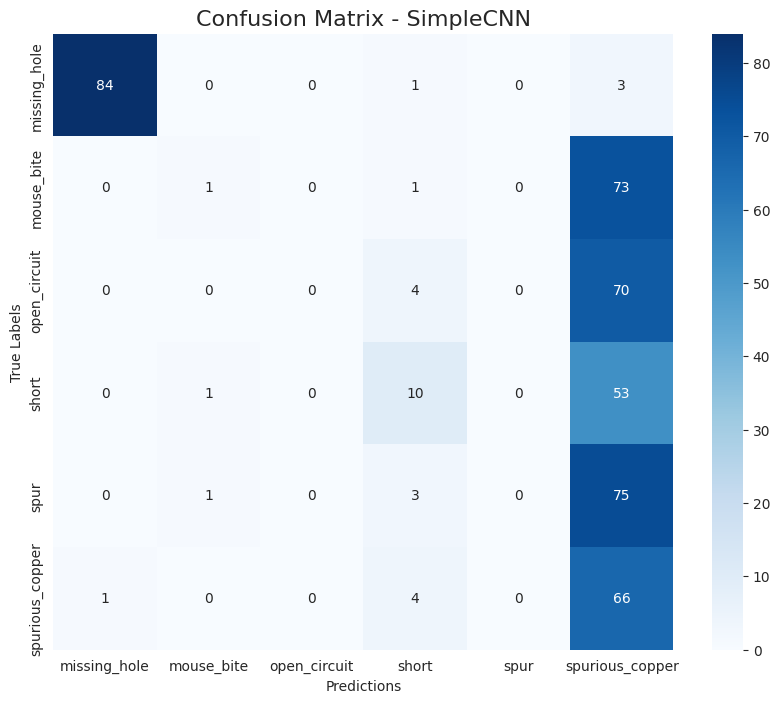

 SimpleCNN model saved


In [63]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(0.7),
            nn.Linear(128 * 14 * 14, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(0.6),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

cnn_scratch_model = SimpleCNN(num_classes=num_classes).to(device)
optimizer_cnn = optim.SGD(cnn_scratch_model.parameters(), lr=0.01, momentum=0.9)

print("Training SimpleCNN from scratch...")
best_cnn_scratch_model, history_cnn = train_model(cnn_scratch_model, criterion, optimizer_cnn, num_epochs=5, patience=3)

print("\n--- SimpleCNN Model Evaluation ---")
evaluate_model(best_cnn_scratch_model, dataloaders['test'], "SimpleCNN")

torch.save(best_cnn_scratch_model.state_dict(), "/content/simple_cnn_model.pth")
print(" SimpleCNN model saved")


# **Model Performance Comparison**

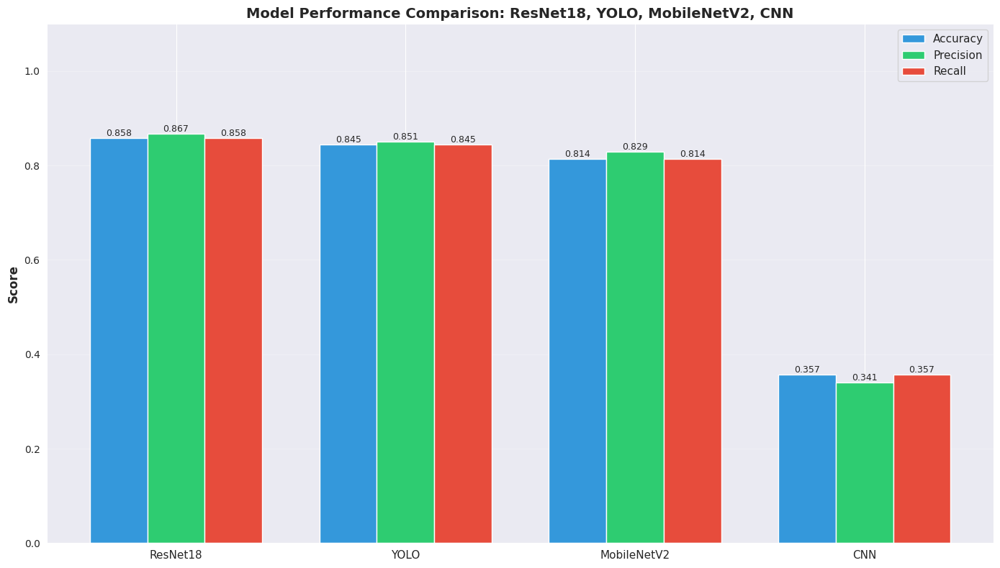


MODEL COMPARISON SUMMARY

ResNet18:
  Accuracy:  0.8581 (85.81%)
  Precision: 0.8671
  Recall:    0.8581

YOLO:
  Accuracy:  0.8448 (84.48%)
  Precision: 0.8510
  Recall:    0.8448

MobileNetV2:
  Accuracy:  0.8137 (81.37%)
  Precision: 0.8289
  Recall:    0.8137

CNN:
  Accuracy:  0.3570 (35.70%)
  Precision: 0.3405
  Recall:    0.3570


In [65]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import numpy as np

def get_comprehensive_metrics(model, test_loader, model_name):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs.to(device))
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')

    return {
        'model': model_name,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall
    }

resnet_metrics = get_comprehensive_metrics(best_resnet_model, dataloaders['test'], 'ResNet18')
yolo_metrics = get_comprehensive_metrics(best_yolo_model, dataloaders['test'], 'YOLO')
mobilenet_metrics = get_comprehensive_metrics(best_mobilenet_model, dataloaders['test'], 'MobileNetV2')
cnn_metrics = get_comprehensive_metrics(best_cnn_scratch_model, dataloaders['test'], 'CNN')

models = [resnet_metrics, yolo_metrics, mobilenet_metrics, cnn_metrics]

model_names = [m['model'] for m in models]
accuracies = [m['accuracy'] for m in models]
precisions = [m['precision'] for m in models]
recalls = [m['recall'] for m in models]

x = np.arange(len(model_names))
width = 0.25

fig, ax = plt.subplots(figsize=(14, 8))

bars1 = ax.bar(x - width, accuracies, width, label='Accuracy', color='#3498db')
bars2 = ax.bar(x, precisions, width, label='Precision', color='#2ecc71')
bars3 = ax.bar(x + width, recalls, width, label='Recall', color='#e74c3c')

ax.set_ylabel('Score', fontsize=12, fontweight='bold')
ax.set_title('Model Performance Comparison: ResNet18, YOLO, MobileNetV2, CNN', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(model_names, fontsize=11)
ax.legend(fontsize=11)
ax.set_ylim(0, 1.1)
ax.grid(axis='y', alpha=0.3)

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.savefig('/content/model_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n" + "="*70)
print("MODEL COMPARISON SUMMARY")
print("="*70)
for m in models:
    print(f"\n{m['model']}:")
    print(f"  Accuracy:  {m['accuracy']:.4f} ({m['accuracy']*100:.2f}%)")
    print(f"  Precision: {m['precision']:.4f}")
    print(f"  Recall:    {m['recall']:.4f}")
print("="*70)


# **Fine-Tuning ResNet18**


--- Start of Fine-Tuning ResNet18 ---
ResNet18 model prepared for fine-tuning.
Epoch 1/5 | ----------
Train Loss: 0.9487 Acc: 0.6858
Val Loss: 0.3846 Acc: 0.8901
Validation loss improved (inf -> 0.3846). Saving model...

Epoch 2/5 | ----------
Train Loss: 0.3210 Acc: 0.9066
Val Loss: 0.1502 Acc: 0.9596
Validation loss improved (0.3846 -> 0.1502). Saving model...

Epoch 3/5 | ----------
Train Loss: 0.1638 Acc: 0.9499
Val Loss: 0.0993 Acc: 0.9686
Validation loss improved (0.1502 -> 0.0993). Saving model...

Epoch 4/5 | ----------
Train Loss: 0.1049 Acc: 0.9684
Val Loss: 0.0805 Acc: 0.9731
Validation loss improved (0.0993 -> 0.0805). Saving model...

Epoch 5/5 | ----------
Train Loss: 0.0716 Acc: 0.9810
Val Loss: 0.0549 Acc: 0.9843
Validation loss improved (0.0805 -> 0.0549). Saving model...

Training complete in 11m 3s
Best Validation Loss: 0.054876

--- Evaluation of the Fine-Tuned ResNet18 Model ---

--- Final evaluation of model 'ResNet18 (Fine-Tuned)' on the Test Set ---

          

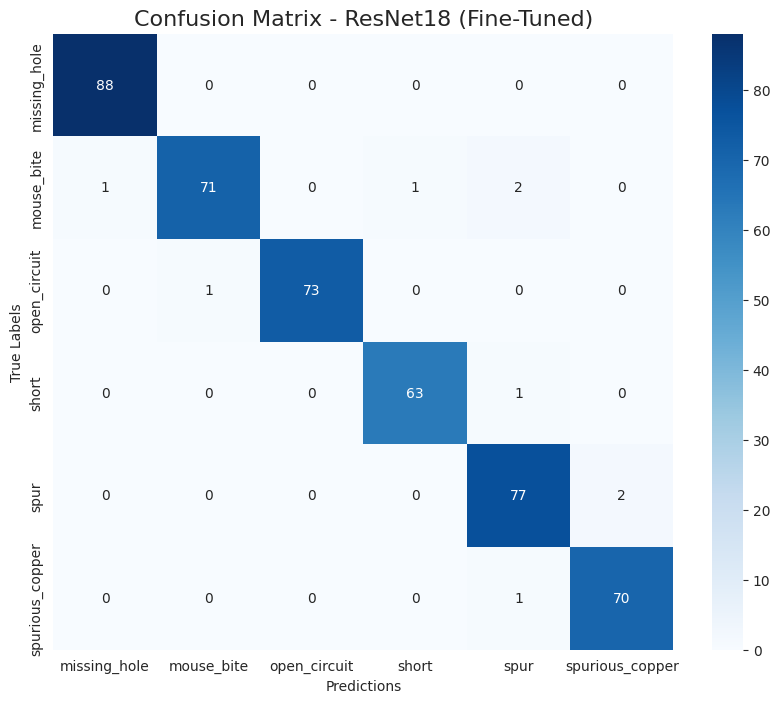

In [51]:
print("\n--- Start of Fine-Tuning ResNet18 ---")

if torch.cuda.is_available():
    torch.cuda.empty_cache()

#  Reload the pre-trained model
finetune_model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

#  Unfreeze the last layers. For example, the last two blocks
for name, param in finetune_model.named_parameters():
    if "layer3" in name or "layer4" in name or "fc" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

#  Replace the classification head
num_ftrs = finetune_model.fc.in_features
finetune_model.fc = nn.Linear(num_ftrs, num_classes)
finetune_model = finetune_model.to(device)

#  Create an optimizer with different learning rates
optimizer_finetune = optim.Adam([
    {'params': finetune_model.fc.parameters(), 'lr': 1e-3},
    {'params': finetune_model.layer4.parameters(), 'lr': 1e-5},
    {'params': finetune_model.layer3.parameters(), 'lr': 1e-5}
])

print("ResNet18 model prepared for fine-tuning.")

# Launch training with the same function
best_finetune_model, history_finetune = train_model(
    finetune_model,
    criterion,
    optimizer_finetune,
    num_epochs=5,
    patience=5
)

#  Evaluate the fine-tuned model
print("\n--- Evaluation of the Fine-Tuned ResNet18 Model ---")
evaluate_model(best_finetune_model, dataloaders['test'], "ResNet18 (Fine-Tuned)")



MODEL PERFORMANCE COMPARISON TABLE
              Model  Accuracy  Precision   Recall  F1-Score
           ResNet18  0.858093   0.867085 0.858093  0.856696
         YOLO-style  0.844789   0.850982 0.844789  0.840454
        MobileNetV2  0.813747   0.828931 0.813747  0.815351
        CNN Scratch  0.356984   0.340517 0.356984  0.276930
Fine-tuned ResNet18  0.980044   0.980257 0.980044  0.980036


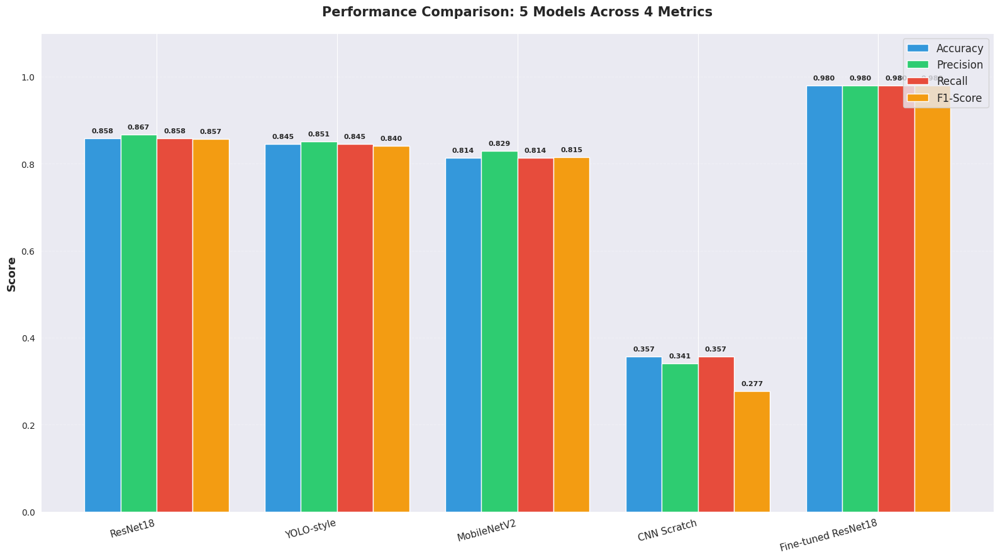


 Comparison chart saved at: /content/5_models_comparison.png

 Best Performing Model: Fine-tuned ResNet18 with 98.00% accuracy


In [68]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def get_comprehensive_metrics(model, test_loader, model_name):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs.to(device))
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')

    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    }

resnet_metrics = get_comprehensive_metrics(best_resnet_model, dataloaders['test'], 'ResNet18')
yolo_metrics = get_comprehensive_metrics(best_yolo_model, dataloaders['test'], 'YOLO-style')
mobilenet_metrics = get_comprehensive_metrics(best_mobilenet_model, dataloaders['test'], 'MobileNetV2')
cnn_metrics = get_comprehensive_metrics(best_cnn_scratch_model, dataloaders['test'], 'CNN Scratch')
finetuned_resnet_metrics = get_comprehensive_metrics(best_finetune_model, dataloaders['test'], 'Fine-tuned ResNet18')

models_data = [resnet_metrics, yolo_metrics, mobilenet_metrics, cnn_metrics, finetuned_resnet_metrics]
df = pd.DataFrame(models_data)

print("\n" + "="*80)
print("MODEL PERFORMANCE COMPARISON TABLE")
print("="*80)
print(df.to_string(index=False))
print("="*80)

model_names = df['Model'].tolist()
accuracies = df['Accuracy'].tolist()
precisions = df['Precision'].tolist()
recalls = df['Recall'].tolist()
f1_scores = df['F1-Score'].tolist()

x = np.arange(len(model_names))
width = 0.2

fig, ax = plt.subplots(figsize=(16, 9))

bars1 = ax.bar(x - 1.5*width, accuracies, width, label='Accuracy', color='#3498db')
bars2 = ax.bar(x - 0.5*width, precisions, width, label='Precision', color='#2ecc71')
bars3 = ax.bar(x + 0.5*width, recalls, width, label='Recall', color='#e74c3c')
bars4 = ax.bar(x + 1.5*width, f1_scores, width, label='F1-Score', color='#f39c12')

ax.set_ylabel('Score', fontsize=13, fontweight='bold')
ax.set_title('Performance Comparison: 5 Models Across 4 Metrics', fontsize=15, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(model_names, fontsize=11, rotation=15, ha='right')
ax.legend(fontsize=12, loc='upper right')
ax.set_ylim(0, 1.1)
ax.grid(axis='y', alpha=0.3, linestyle='--')

for bars in [bars1, bars2, bars3, bars4]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontsize=8, fontweight='bold')

plt.tight_layout()
plt.savefig('/content/5_models_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n Comparison chart saved at: /content/5_models_comparison.png")

best_model_idx = df['Accuracy'].idxmax()
best_model = df.loc[best_model_idx, 'Model']
best_accuracy = df.loc[best_model_idx, 'Accuracy']

print(f"\n Best Performing Model: {best_model} with {best_accuracy*100:.2f}% accuracy")
print("="*80)

# **Loss Curves**

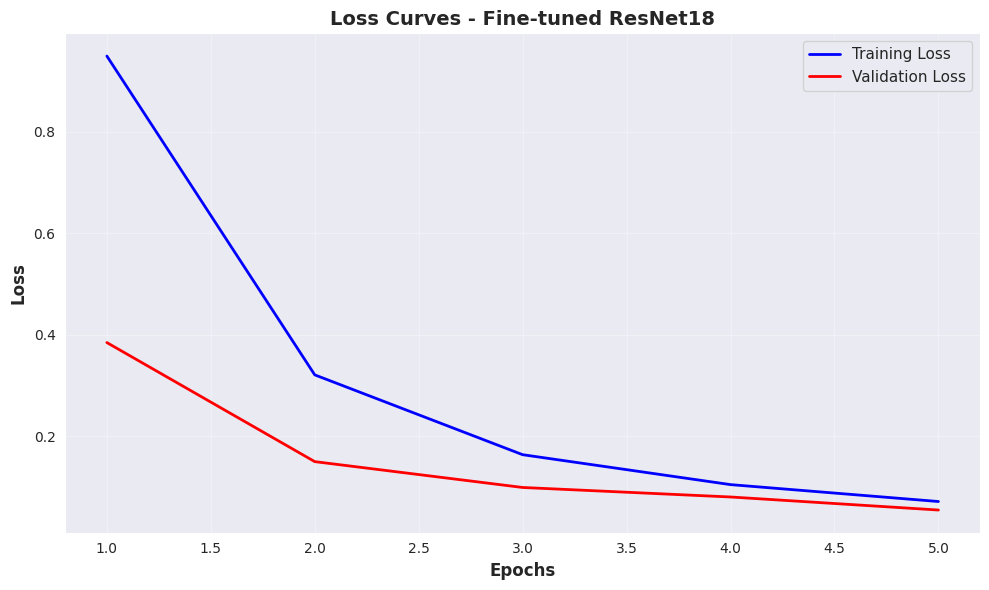

In [72]:
import matplotlib.pyplot as plt

train_loss = history_finetune['train_loss']
val_loss = history_finetune['val_loss']
epochs_range = range(1, len(train_loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs_range, train_loss, 'b-', label='Training Loss', linewidth=2)
plt.plot(epochs_range, val_loss, 'r-', label='Validation Loss', linewidth=2)
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Loss', fontsize=12, fontweight='bold')
plt.title('Loss Curves - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/loss_curves.png', dpi=300, bbox_inches='tight')
plt.show()


# **Learning Curves (Accuracy)**

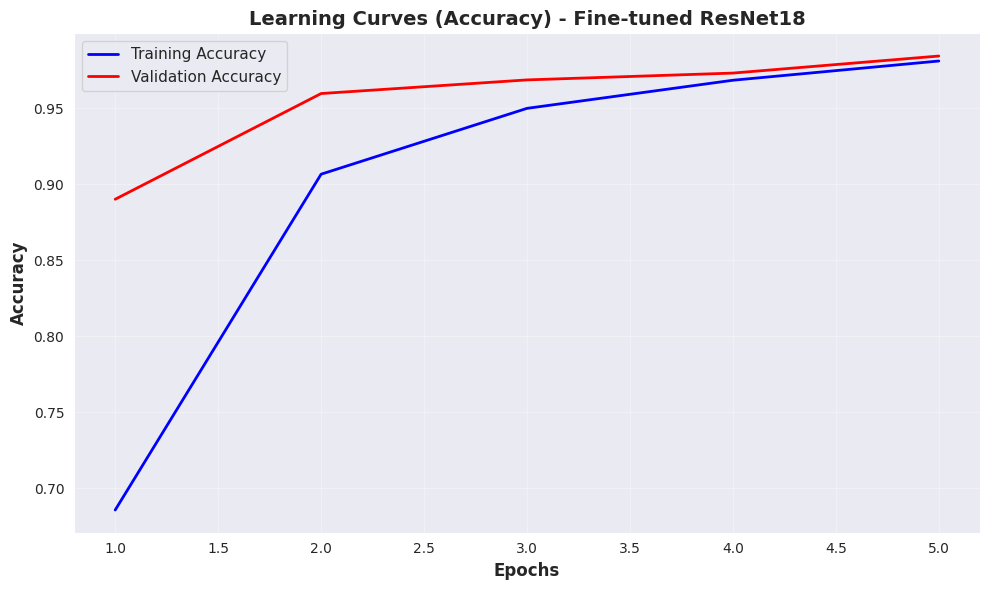

In [73]:
train_acc = history_finetune['train_acc']
val_acc = history_finetune['val_acc']

plt.figure(figsize=(10, 6))
plt.plot(epochs_range, train_acc, 'b-', label='Training Accuracy', linewidth=2)
plt.plot(epochs_range, val_acc, 'r-', label='Validation Accuracy', linewidth=2)
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Accuracy', fontsize=12, fontweight='bold')
plt.title('Learning Curves (Accuracy) - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/learning_curves.png', dpi=300, bbox_inches='tight')
plt.show()


# **Training Curves (Loss)**

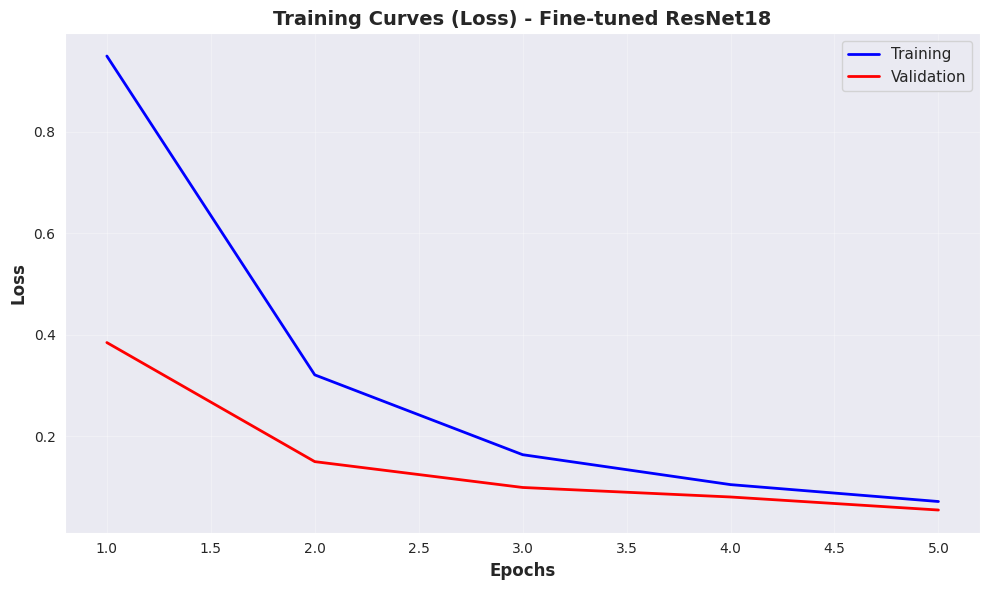

In [74]:
plt.figure(figsize=(10, 6))
plt.plot(epochs_range, train_loss, 'b-', label='Training', linewidth=2)
plt.plot(epochs_range, val_loss, 'r-', label='Validation', linewidth=2)
plt.xlabel('Epochs', fontsize=12, fontweight='bold')
plt.ylabel('Loss', fontsize=12, fontweight='bold')
plt.title('Training Curves (Loss) - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/training_curves_loss.png', dpi=300, bbox_inches='tight')
plt.show()


# **Confusion Matrix**

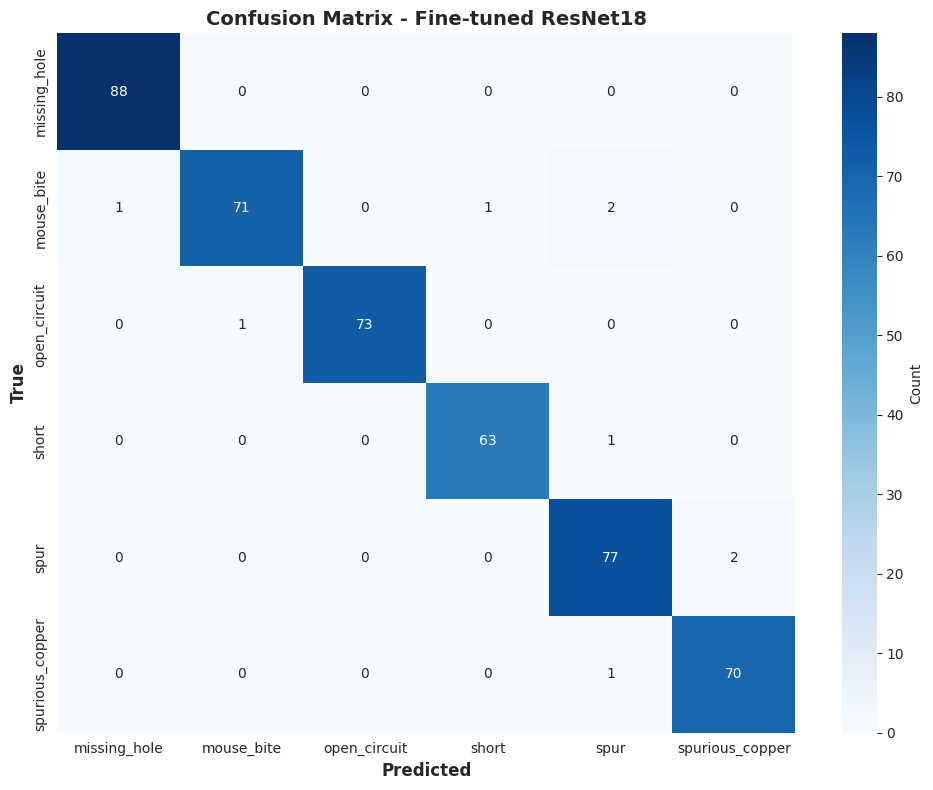

In [75]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np

best_finetune_model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        outputs = best_finetune_model(inputs.to(device))
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names,
            cbar_kws={'label': 'Count'})
plt.xlabel('Predicted', fontsize=12, fontweight='bold')
plt.ylabel('True', fontsize=12, fontweight='bold')
plt.title('Confusion Matrix - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()


# **ROC Curves (Multi-class)**

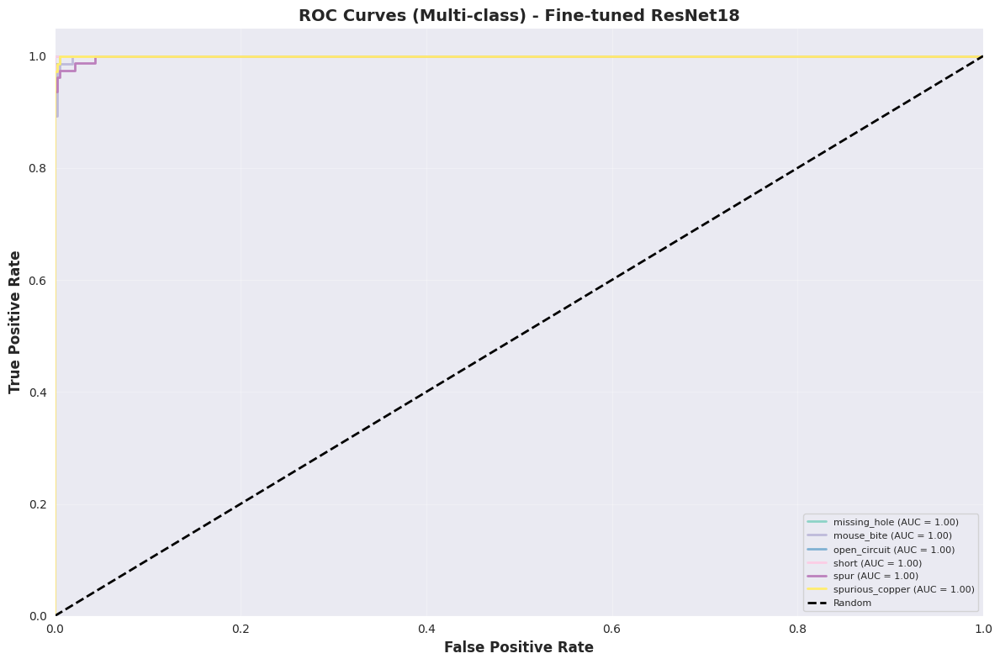

In [78]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

best_finetune_model.eval()
all_preds = []
all_labels = []
all_probs = []

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        outputs = best_finetune_model(inputs.to(device))
        probs = torch.softmax(outputs, dim=1)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())
        all_labels.extend(labels.numpy())

all_probs = np.array(all_probs)
n_classes = len(class_names)
y_test_bin = label_binarize(all_labels, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], all_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(12, 8))
colors = plt.cm.Set3(np.linspace(0, 1, n_classes))

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
            label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=12, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=12, fontweight='bold')
plt.title('ROC Curves (Multi-class) - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.legend(loc="lower right", fontsize=8)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('/content/roc_curves.png', dpi=300, bbox_inches='tight')
plt.show()

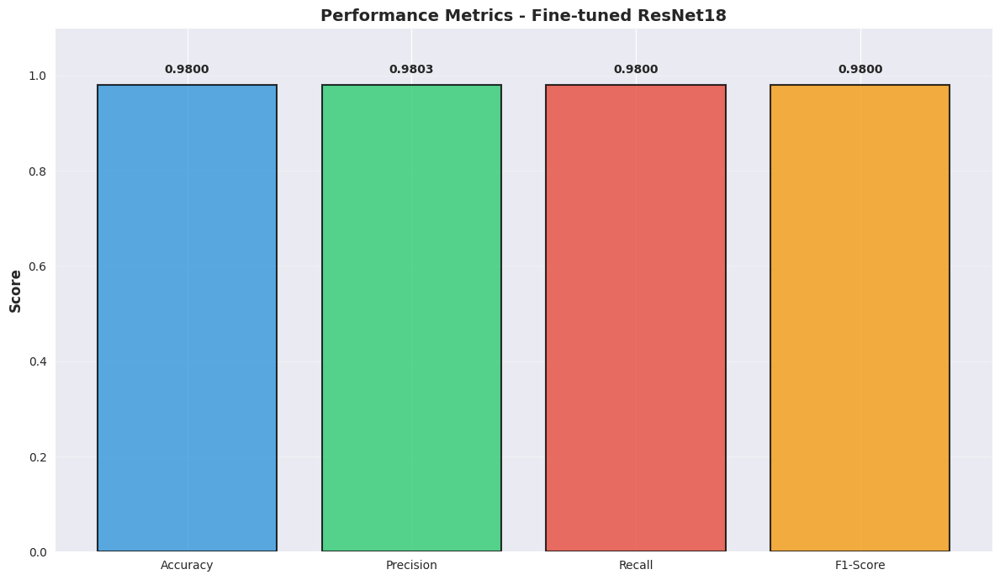

\ All plots saved!


In [79]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='weighted')
recall = recall_score(all_labels, all_preds, average='weighted')
f1 = f1_score(all_labels, all_preds, average='weighted')

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
values = [accuracy, precision, recall, f1]
colors_bar = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12']

plt.figure(figsize=(12, 7))
bars = plt.bar(metrics, values, color=colors_bar, alpha=0.8, edgecolor='black', linewidth=1.5)
plt.ylim([0, 1.1])
plt.ylabel('Score', fontsize=12, fontweight='bold')
plt.title('Performance Metrics - Fine-tuned ResNet18', fontsize=14, fontweight='bold')
plt.grid(axis='y', alpha=0.3)

for bar, value in zip(bars, values):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.02,
            f'{value:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig('/content/performance_metrics.png', dpi=300, bbox_inches='tight')
plt.show()

print("\ All plots saved!")
